# Visualization Analysis of ICESat Glacier Elevation Changes

This notebook integrates all data visualization code related to ICESat.

**Author**: Refactored from original code  
**Date**: 2024  
**Data Source**: ICESat

---

## 1. Import Functions and Libraries

This section imports all necessary Python libraries, including those for data processing, statistical analysis, geospatial analysis, and visualization.

In [1]:
# 基础数据处理
import pandas as pd
import numpy as np
from datetime import datetime as dt
import time
import datetime
import os

# 统计分析
from statsmodels.tsa.seasonal import STL
import statsmodels.api as sm
from statsmodels.robust.robust_linear_model import RLM
from hampel import hampel
import pwlf

# 可视化
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import matplotlib.ticker as mticker
from mpl_toolkits.axes_grid1.inset_locator import mark_inset, inset_axes
import seaborn as sns

# 地理空间分析
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeat
import cartopy.io.img_tiles as cimgt
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# 设置样式
plt.rcParams['axes.unicode_minus'] = False
sns.set(style="ticks")

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42 
plt.rcParams['ps.fonttype'] = 42 

print("✓ 所有库导入成功")


✓ 所有库导入成功


### 1.1 Define Utility Functions

In [2]:
def toYearFraction(date):
    """
    将日期转换为年份的小数表示
    
    Parameters:
    -----------
    date : datetime
        输入的日期时间对象
    
    Returns:
    --------
    float
        年份的小数表示 (例如: 2020.5 表示2020年中)
    """
    def sinceEpoch(date):
        return time.mktime(date.timetuple())
    
    s = sinceEpoch
    year = date.year
    startOfThisYear = dt(year=year, month=1, day=1)
    startOfNextYear = dt(year=year+1, month=1, day=1)
    
    yearElapsed = s(date) - s(startOfThisYear)
    yearDuration = s(startOfNextYear) - s(startOfThisYear)
    fraction = yearElapsed / yearDuration
    
    return date.year + fraction

---

## 2. Load data



### 2.2 Load Grid-Scale ICESat Data

In [ ]:
# 加载网格尺度的ICESat数据（包含高度带信息）
print("加载网格尺度ICESat数据...")
data_grid_ele = pd.read_excel(
    r"E:\revised_NCC_data\ICESat_result\ICESat_seasonal_elevation_results.xlsx",
    sheet_name='campaign_value', header=0,
)
data_grid_num = pd.read_excel(
    r"E:\revised_NCC_data\ICESat_result\ICESat_seasonal_elevation_results.xlsx",
    sheet_name='campaign_count', header=0,
)

ele_grid = data_grid_ele[['mid_day','date'] + np.arange(1,497).tolist()]
num_grid = data_grid_num[['mid_day','date'] + np.arange(1,497).tolist()]

# 转换日期为年份小数
for k in range(len(ele_grid['date'])):
    ele_grid['mid_day'].iloc[k] = toYearFraction(ele_grid['date'].iloc[k])
    num_grid['mid_day'].iloc[k] = toYearFraction(num_grid['date'].iloc[k])

ele_grid['mid_day'] = ele_grid['mid_day'].astype(float)
num_grid['mid_day'] = num_grid['mid_day'].astype(float)
ele_grid = ele_grid.reset_index(drop=True)
num_grid = num_grid.reset_index(drop=True)

# 加载网格面积数据
area_grid = pd.read_excel(
    "E:/HMA/HMA高度带.xlsx",
    sheet_name='grid10_100_496', header=0, nrows=66, usecols='A:SC'
)

print(f"✓ 网格尺度数据加载完成")
print(f"  - 网格数量: {len(ele_grid.columns)-2}")
print(f"  - 时间序列长度: {len(ele_grid)}")


加载网格尺度ICESat数据...
✓ 网格尺度数据加载完成
  - 网格数量: 496
  - 时间序列长度: 19


C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\1007643191.py:17: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  ele_grid['mid_day'].iloc[k] = toYearFraction(ele_grid['date'].iloc[k])
C:\Users\Administrator\AppData\Local\Temp\ipyker

### 2.3 Load Geospatial Data

In [4]:
# 研究区边界
print("加载地理空间数据...")
studyregion = gpd.read_file("E:/HMA/HMA_boundary/HMA_one.shp")

# 网格
grids = gpd.read_file(r"E:\revised_NCC_data\grid10_pdd\HMA_fishnet_10_clip_coreg_filled.shp")

# 子区域
subregion = gpd.read_file(
    "E:/HMA_subregion/regions_hma_v03_zheng/"
    "boundary_mountain_regions_hma_v3_zheng_20200601.shp"
)

# 冰川
glacier = gpd.read_file("E:/HMA/Hugonnet/per_glacier/rgi_hma.shp")

# 河流
river2 = gpd.read_file(r"E:\HMA_subregion\河网\三级以上河流\hyd2_4l.shp")

print("✓ 地理空间数据加载完成")
print(f"  - 研究区: {len(studyregion)} 个多边形")
print(f"  - 网格: {len(grids)} 个")
print(f"  - 子区域: {len(subregion)} 个")
print(f"  - 冰川: {len(glacier)} 条")


加载地理空间数据...
✓ 地理空间数据加载完成
  - 研究区: 1 个多边形
  - 网格: 496 个
  - 子区域: 22 个
  - 冰川: 95536 条


---

## 4. Grid-Scale Spatial Distribution Analysis (Key Module of HMA_grid_series_compute.py)

This section processes grid-scale ICESat-2 data, calculates trends, and generates spatial distribution bubble charts. This is a critical spatial visualization for the paper.

### 4.1 Grid Trend Computation (including Hampel Filter)

In [5]:
def calculate_grid_trends(ele_grid, num_grid, start_time=None, end_time=None):
    """
    计算所有网格的ICESat-2高程变化趋势 (修改版)
    
    核心步骤：
    1. 应用数量阈值过滤（<20个观测值设为NaN）
    2. 使用Hampel滤波器去除时间序列中的异常值
    3. 鲁棒线性回归（RLM）计算趋势、p-value和95%置信区间
    
    Returns:
    --------
    pd.DataFrame
        包含每个网格趋势的DataFrame
        - 'Slope': 斜率/趋势 (m/yr)
        - 'Pvalue': p-value (显著性)
        - 'CI/2': 95%置信区间半宽度 (m/yr)
        - 'Intercept': 截距 (m)
    """
    head_grid = ele_grid.columns.tolist()[2:] # 1,2,...,496
    # 1. 应用数量阈值
    for i in head_grid:
        mask = (num_grid[i] < 20) | (ele_grid[i] == 0) | (pd.isna(num_grid[i]))
        ele_grid.loc[mask, i] = np.nan
    
    # 初始化 results DataFrame
    results = pd.DataFrame(
        index=head_grid, 
        columns=['Slope', 'Pvalue', 'CI/2', 'Intercept'],
        dtype=float  # 预先指定数据类型
    )
    
    ele_grid_copy = ele_grid.copy()
    hampel_results = ele_grid.copy()
    hampel_results[head_grid] = np.nan
    if start_time is not None:
        ele_grid_copy = ele_grid_copy[(ele_grid_copy['date']>=start_time) & (ele_grid_copy['date']<end_time)]
        
    for i in head_grid:
        valid_data = ele_grid_copy[[i, 'mid_day']].dropna()
        
        if len(valid_data) < 10:
            continue
        
        grid = valid_data.reset_index(drop=True)#连续索引
        year = grid['mid_day']
        dh = grid[i]
        
        # 2. Hampel滤波器去除异常值
        hamp_series = hampel(dh, window_size=3, n=3, imputation=True)
        hamp_series = hamp_series.astype(float)
        
        # 3. 鲁棒线性回归 (RLM)
        X = sm.add_constant(year)
        y = hamp_series
        
        rlm_model = RLM(y, X, M=sm.robust.norms.HuberT())
        rlm_results = rlm_model.fit()

        slope = rlm_results.params.iloc[1]
        intercept = rlm_results.params.iloc[0]
        pvalue = rlm_results.pvalues.iloc[1]
        
        # 计算95%置信区间
        conf_int = rlm_results.conf_int(alpha=0.05)
        # conf_int 是一个 DataFrame，[1] 是斜率的置信区间
        CI_half_width = (conf_int.iloc[1, 1] - conf_int.iloc[1, 0]) / 2

        results.loc[i, 'Slope'] = slope
        results.loc[i, 'Pvalue'] = pvalue
        results.loc[i, 'CI/2'] = CI_half_width
        results.loc[i, 'Intercept'] = intercept

        hampel_results.loc[valid_data.index, i] = hamp_series.values
    
    return results, hampel_results

### 4.2 Grid Spatial Distribution Visualization (Bubble Chart)

In [6]:
def plot_grid_bubble_map(var, title_text, grids, save_path=None, pvalue=None):
    """
    绘制网格尺度的冰川高程变化空间分布气泡图
    
    Parameters:
    -----------
    var : str
        要显示的变量名 
        'dh19222' = 2018.10-2022.09 ICESat-2期间趋势
        'dh00201' = 2000-2020 长期趋势
    save_path : str, optional
        图片保存路径
    
    可视化特点：
    - 使用Albers等积投影保持面积准确性
    - 气泡大小表示冰川面积
    - 颜色表示高程变化速率
    - 包含消融/积累/无观测统计饼图
    """
    # 设置底图
    arcgis_url = ('https://server.arcgisonline.com/arcgis/rest/services/'
                  'World_Terrain_Base/MapServer/tile/{z}/{y}/{x}.jpg')
    tiles = cimgt.GoogleTiles(url=arcgis_url)
    
    fig = plt.figure(figsize=(18, 12))
    
    # 使用Albers等积投影
    map_proj = ccrs.AlbersEqualArea(
        central_longitude=87.5, 
        central_latitude=34.7,
        standard_parallels=(24.5, 47.5)
    )
    
    ax = fig.add_subplot(1, 1, 1, projection=map_proj)
    extent = [63.6, 108.3, 24.5, 47.5]
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    
    # 添加底图和特征
    ax.add_image(tiles, 9)
    ax.add_feature(cfeat.RIVERS.with_scale('10m'), linewidth=2, zorder=1)
    ax.add_feature(cfeat.LAKES.with_scale('10m'), zorder=1)
    
    # 绘制边界
    studyregion.plot(ax=ax, color="none", edgecolor="maroon", 
                      linewidth=3, transform=ccrs.PlateCarree(), zorder=2)
    subregion.plot(ax=ax, color="none", edgecolor="maroon", 
                    linewidth=2, transform=ccrs.PlateCarree(), zorder=5)
    
    # 设置色标（红-白-蓝）
    colors = [plt.cm.bwr(255), plt.cm.bwr(127), plt.cm.bwr(0)]
    nodes = [0, 0.66666666, 1]  # 白色偏向蓝色（积累区）
    colormap = mcolors.LinearSegmentedColormap.from_list('cmap', list(zip(nodes, colors)))

    if pvalue is not None:
        grids = grids[~(grids[var.replace('k_', 'p_')]>pvalue)]#把p<=0.05和无观测的全保留下来
    
    # 处理无观测数据
    grids_copy = grids.copy()
    mask = (grids_copy[var] == 0) | (pd.isna(grids_copy[var]))
    grids_copy["Area"][mask] = 0
    
    # 绘制散点
    plt.scatter(grids_copy['x'], grids_copy['y'], s=grids_copy["Area"], c=grids_copy[var],
                transform=ccrs.PlateCarree(), cmap=colormap, 
                vmin=-1, vmax=0.5, edgecolor='k', zorder=2)
    
    ax.grid('both', linestyle='--', linewidth=0.5)
    
    # 添加文本标签
    plt.text(x=63.5, y=31.3, s='Glacier area', rotation=0, ha='left', 
                va='baseline', transform=ccrs.PlateCarree(), 
                fontdict=dict(fontsize=25, color='k', family='Arial', weight='normal'))
    plt.text(x=107.6, y=38.5, s='Elevation change rate', rotation=90, 
                ha='left', va='baseline', transform=ccrs.PlateCarree(), 
                fontdict=dict(fontsize=25, color='k', family='Arial', weight='normal'))
    
    plt.text(x=65.9, y=30.6, s='(km$^2$)', rotation=0, ha='left', va='baseline',
             transform=ccrs.PlateCarree(), 
             fontdict=dict(fontsize=25, color='k', family='Arial', weight='normal'))
    plt.text(x=110, y=41.2, s='(m/yr)', rotation=90, ha='left', va='baseline',
             transform=ccrs.PlateCarree(), 
             fontdict=dict(fontsize=25, color='k', family='Arial', weight='normal'))
    
    # 标题
    t = plt.text(x=56.7, y=45, s=title_text, rotation=0, ha='left', va='baseline',
                 transform=ccrs.PlateCarree(), 
                 fontdict=dict(fontsize=27, color='k', family='Arial', weight='normal'))
    t.set_bbox(dict(facecolor='white', alpha=0.5, edgecolor='white'))
    
    # 坐标网格
    gl = ax.gridlines(draw_labels=True, linestyle=":", linewidth=0.3, 
                       x_inline=False, y_inline=False, color='k')
    gl.top_labels = True
    gl.right_labels = True
    gl.bottom_labels = False
    gl.left_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlocator = mticker.FixedLocator(np.arange(65, 108, 10))
    gl.ylocator = mticker.FixedLocator(np.arange(25, 47, 5))
    gl.xlabel_style = {'size': 23}
    gl.ylabel_style = {'size': 23}
    
    # 色标
    position = fig.add_axes([0.75, 0.61, 0.015, 0.22])
    b = plt.colorbar(ax=ax, cax=position, extend='neither', 
                      orientation='vertical', shrink=0.3)
    ax2 = b.ax
    ax2.yaxis.set_ticks_position('left')
    ax2.tick_params(labelsize=23, left=True, right=True)
    
    # 图例标记
    marker1 = ax.scatter([], [], s=50, c='k', alpha=0.3)
    marker2 = ax.scatter([], [], s=500, c='k', alpha=0.3)
    marker3 = ax.scatter([], [], s=1000, c='k', alpha=0.3)
    marker4 = ax.scatter([], [], s=2000, c='k', alpha=0.3)
    ax.legend(handles=[marker1, marker2, marker3, marker4], 
              labels=['50', '500', '1000', '2000'], 
              scatterpoints=1, frameon=False, fontsize=23, 
              labelspacing=1.35, handletextpad=1,
              bbox_to_anchor=(0.198, 0.325), ncol=1, 
              facecolor="white", edgecolor="None")
    
    # 统计饼图
    ablation = grids['Area'][grids_copy[var] < 0].sum()
    accumulation = grids['Area'][grids_copy[var] > 0].sum()
    nobservation = grids['Area'][grids_copy['Area'] == 0].sum()

    nobservation_ratio = nobservation/(ablation+accumulation+nobservation)*100 #%
    if nobservation_ratio >= 0.5:
        ax1 = fig.add_axes([0.16, 0.63, 0.2, 0.2])
        plt.pie(x=[ablation, accumulation, nobservation],
                labels=None,
                colors=[plt.cm.bwr(235), plt.cm.bwr(30), "white"],
                autopct='%.0f%%',
                explode=(0.2, 0.1, 0.1),
                textprops={'color': 'k', 'fontsize': 20, 
                        'fontfamily': 'Arial', 'fontweight': 'bold'},
                wedgeprops={'edgecolor': 'k', 'linestyle': '--', 'alpha': 0.9})
    else:
        ax1 = fig.add_axes([0.16, 0.63, 0.2, 0.2])
        plt.pie(x=[ablation, accumulation],
                labels=None,
                colors=[plt.cm.bwr(235), plt.cm.bwr(30)],
                autopct='%.0f%%',
                explode=(0.2, 0.1),
                textprops={'color': 'k', 'fontsize': 20, 
                        'fontfamily': 'Arial', 'fontweight': 'bold'},
                wedgeprops={'edgecolor': 'k', 'linestyle': '--', 'alpha': 0.9})
    ax1.set_facecolor("gray")
    
    if save_path:
        plt.savefig(save_path, dpi=600, bbox_inches='tight')
    
    plt.show()
    #return fig


### 4.3 2003 to 2010


In [7]:
grids.index = ele_grid.columns.tolist()[2:]
if np.isin(['k_03to10'], grids.columns).any():
    pass
else:
    grid_trends,_ = calculate_grid_trends(ele_grid, num_grid) # ele_grid中的0用nan填充了, m/yr
    grid_trends.columns = ['k_03to10', 'p_03to10', 'CIhalf_03to10','b_03to10']

    grids = pd.concat([grids, grid_trends], axis=1)
grids

d:\Anaconda\install\envs\gee_dask\Lib\site-packages\hampel.py:49: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  rolling_median = rolling_ts.median().fillna(method='bfill').fillna(method='ffill')
d:\Anaconda\install\envs\gee_dask\Lib\site-packages\hampel.py:50: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  rolling_sigma = k*(rolling_ts.apply(median_absolute_deviation).fillna(method='bfill').fillna(method='ffill'))
d:\Anaconda\install\envs\gee_dask\Lib\site-packages\hampel.py:49: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  rolling_median = rolling_ts.median().fillna(method='bfill').fillna(method='ffill')
d:\Anaconda\install\envs\gee_dask\Lib\site-packages\hampel.py:50: FutureWarning: Series.fillna with 'method' is deprecate

,y,Area,x,pdd,pdd_corr,pdd_jiang,dh_all,dh_allcor,id,dh0020,...,coreg_iter,coreg_vs_1,coreg_xs_1,coreg_ys_1,pdd_uncert,geometry,k_03to10,p_03to10,CIhalf_03to10,b_03to10
1,27.6415,0.0000,102.1070,4.303409,0.00000,0.000000,0.000000,0.00000,1,0.00000,...,3.0,0.269653,12.392896,-22.389823,0.199775,"POLYGON ((102.0653 27, 102 27, 102 28, 102.424...",NaN,NaN,NaN,NaN
2,30.5000,512.1670,90.5000,4.389645,3.15134,2.084730,-3.909790,-7.06113,2,-8.91566,...,3.0,0.039551,13.992089,-12.842095,0.020761,"POLYGON ((91 30, 90 30, 90 31, 91 31, 91 30))",-0.336331,0.309163,0.648190,674.545128
3,26.8968,0.0000,90.5124,5.325988,0.00000,0.000000,0.000000,0.00000,3,0.00000,...,8.0,0.118286,10.313449,-15.204489,0.047877,"POLYGON ((91 27, 91 26.7814, 90.9629 26.7802, ...",NaN,NaN,NaN,NaN
4,45.2123,16.7544,79.4945,-6.242164,-3.11918,0.000000,-10.589300,-7.47012,4,-10.20870,...,4.0,-0.314026,11.374880,-10.397242,0.091846,"POLYGON ((79.0739 45.4498, 79.554 45.4116, 80 ...",NaN,NaN,NaN,NaN
5,41.5000,659.4700,78.5000,6.300572,3.78460,3.811520,-3.377860,-7.16246,5,-8.96737,...,2.0,0.538818,10.216806,-17.007171,0.038021,"POLYGON ((79 41, 78 41, 78 42, 79 42, 79 41))",-0.332246,0.002161,0.212307,662.307089
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
492,34.5000,412.8380,75.5000,-0.366332,-1.75128,0.999016,-9.660970,-7.90969,492,-4.54757,...,2.0,-0.143799,10.587047,-15.725570,0.122124,"POLYGON ((76 34, 75 34, 75 35, 76 35, 76 34))",-0.475643,0.232646,0.781054,947.429114
493,37.2473,0.0000,77.4382,2.114425,0.00000,0.000000,0.000000,0.00000,493,0.00000,...,4.0,-0.144287,11.816457,-11.976747,0.018694,"POLYGON ((78 37, 77 37, 77 37.6617, 77.2555 37...",NaN,NaN,NaN,NaN
494,27.5000,102.9040,90.5000,4.612228,3.73339,0.000000,-16.725100,-20.45850,494,-21.13840,...,2.0,-0.042480,11.738170,-16.012244,0.041620,"POLYGON ((91 27, 90 27, 90 28, 91 28, 91 27))",NaN,NaN,NaN,NaN
495,30.5000,127.1690,86.5000,5.511495,3.41028,3.236200,-0.877727,-4.28801,495,-6.41198,...,3.0,-0.046875,13.248154,-13.925485,0.216632,"POLYGON ((87 30, 86 30, 86 31, 87 31, 87 30))",0.601351,0.099808,0.716148,-1208.505817


C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\3324611472.py:60: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  grids_copy["Area"][mask] = 0
C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\3324611472.py:60: SettingWithCop

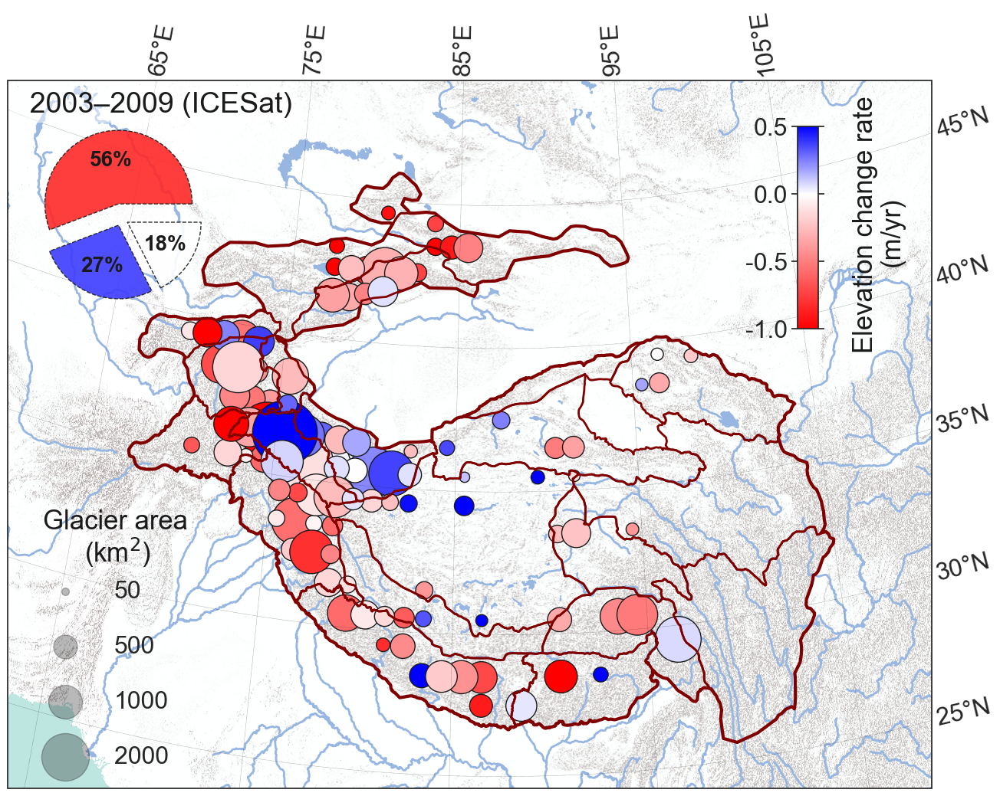

In [8]:
plot_grid_bubble_map(
     var='k_03to10',
     title_text='  2003–2009 (ICESat)',
     grids=grids,
     save_path=r'E:\revised_NCC_data\ICESat_result\ele_changerate_grid\ele_changerate_03to09.pdf',
)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\3324611472.py:60: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  grids_copy["Area"][mask] = 0
C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\3324611472.py:60: SettingWithCop

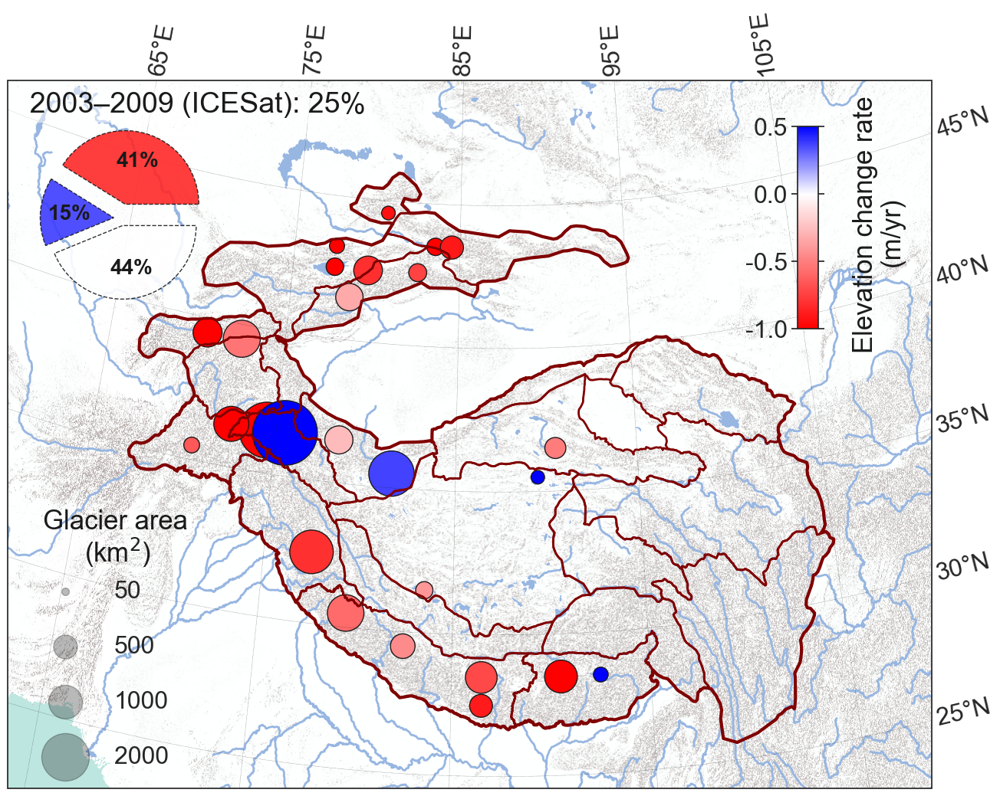

In [10]:
plot_grid_bubble_map(
     var='k_03to10',
     title_text=f'  2003–2009 (ICESat): {(grids['p_03to10']<0.05).sum()/(grids['p_03to10'].notna().sum())*100:.0f}%',
     grids=grids,
     save_path=r'E:\revised_NCC_data\ICESat_result\ele_changerate_grid\ele_signif_changerate_03to09.pdf',
     pvalue=0.05,
)
# title的比例是对有观测的网格考虑的，显著的网格的占比
# pie考虑的是非不显著的网格，即包括nan和显著的网格中的冰川面积

### 4.5 ICESat against NASADEM (2000 vs 2009)

In [11]:
data_grid_ele_year = pd.read_excel(
    r"E:\revised_NCC_data\ICESat_result\ICESat_yearly_elevation_results.xlsx",
    sheet_name='year_value', header=0,
)
data_grid_num_year = pd.read_excel(
    r"E:\revised_NCC_data\ICESat_result\ICESat_yearly_elevation_results.xlsx",
    sheet_name='year_count', header=0,
)

ele_grid = data_grid_ele_year[['start_year','end_year(not included)'] + np.arange(1,497).tolist()]
num_grid = data_grid_num_year[['start_year','end_year(not included)'] + np.arange(1,497).tolist()]

idx = (ele_grid['start_year'] == 2008) & (ele_grid['end_year(not included)'] == 2010)
ele_grid_target = ele_grid.loc[idx, 1:].T
num_grid_target = num_grid.loc[idx, 1:].T

ele_grid_target.index = np.arange(1,497).tolist()
num_grid_target.index = np.arange(1,497).tolist()

In [12]:
if np.isin(['k_00to09'], grids.columns).any():
    pass
else:
    ele_grid_target.columns = ['k_00to09']
    grids = pd.concat([grids, ele_grid_target/9], axis=1)#m/yr

grids

,y,Area,x,pdd,pdd_corr,pdd_jiang,dh_all,dh_allcor,id,dh0020,...,coreg_vs_1,coreg_xs_1,coreg_ys_1,pdd_uncert,geometry,k_03to10,p_03to10,CIhalf_03to10,b_03to10,k_00to09
1,27.6415,0.0000,102.1070,4.303409,0.00000,0.000000,0.000000,0.00000,1,0.00000,...,0.269653,12.392896,-22.389823,0.199775,"POLYGON ((102.0653 27, 102 27, 102 28, 102.424...",NaN,NaN,NaN,NaN,NaN
2,30.5000,512.1670,90.5000,4.389645,3.15134,2.084730,-3.909790,-7.06113,2,-8.91566,...,0.039551,13.992089,-12.842095,0.020761,"POLYGON ((91 30, 90 30, 90 31, 91 31, 91 30))",-0.336331,0.309163,0.648190,674.545128,-0.082363
3,26.8968,0.0000,90.5124,5.325988,0.00000,0.000000,0.000000,0.00000,3,0.00000,...,0.118286,10.313449,-15.204489,0.047877,"POLYGON ((91 27, 91 26.7814, 90.9629 26.7802, ...",NaN,NaN,NaN,NaN,NaN
4,45.2123,16.7544,79.4945,-6.242164,-3.11918,0.000000,-10.589300,-7.47012,4,-10.20870,...,-0.314026,11.374880,-10.397242,0.091846,"POLYGON ((79.0739 45.4498, 79.554 45.4116, 80 ...",NaN,NaN,NaN,NaN,NaN
5,41.5000,659.4700,78.5000,6.300572,3.78460,3.811520,-3.377860,-7.16246,5,-8.96737,...,0.538818,10.216806,-17.007171,0.038021,"POLYGON ((79 41, 78 41, 78 42, 79 42, 79 41))",-0.332246,0.002161,0.212307,662.307089,-0.533395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
492,34.5000,412.8380,75.5000,-0.366332,-1.75128,0.999016,-9.660970,-7.90969,492,-4.54757,...,-0.143799,10.587047,-15.725570,0.122124,"POLYGON ((76 34, 75 34, 75 35, 76 35, 76 34))",-0.475643,0.232646,0.781054,947.429114,-0.834197
493,37.2473,0.0000,77.4382,2.114425,0.00000,0.000000,0.000000,0.00000,493,0.00000,...,-0.144287,11.816457,-11.976747,0.018694,"POLYGON ((78 37, 77 37, 77 37.6617, 77.2555 37...",NaN,NaN,NaN,NaN,NaN
494,27.5000,102.9040,90.5000,4.612228,3.73339,0.000000,-16.725100,-20.45850,494,-21.13840,...,-0.042480,11.738170,-16.012244,0.041620,"POLYGON ((91 27, 90 27, 90 28, 91 28, 91 27))",NaN,NaN,NaN,NaN,-1.766127
495,30.5000,127.1690,86.5000,5.511495,3.41028,3.236200,-0.877727,-4.28801,495,-6.41198,...,-0.046875,13.248154,-13.925485,0.216632,"POLYGON ((87 30, 86 30, 86 31, 87 31, 87 30))",0.601351,0.099808,0.716148,-1208.505817,-0.071819


C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\3324611472.py:60: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  grids_copy["Area"][mask] = 0
C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\3324611472.py:60: SettingWithCop

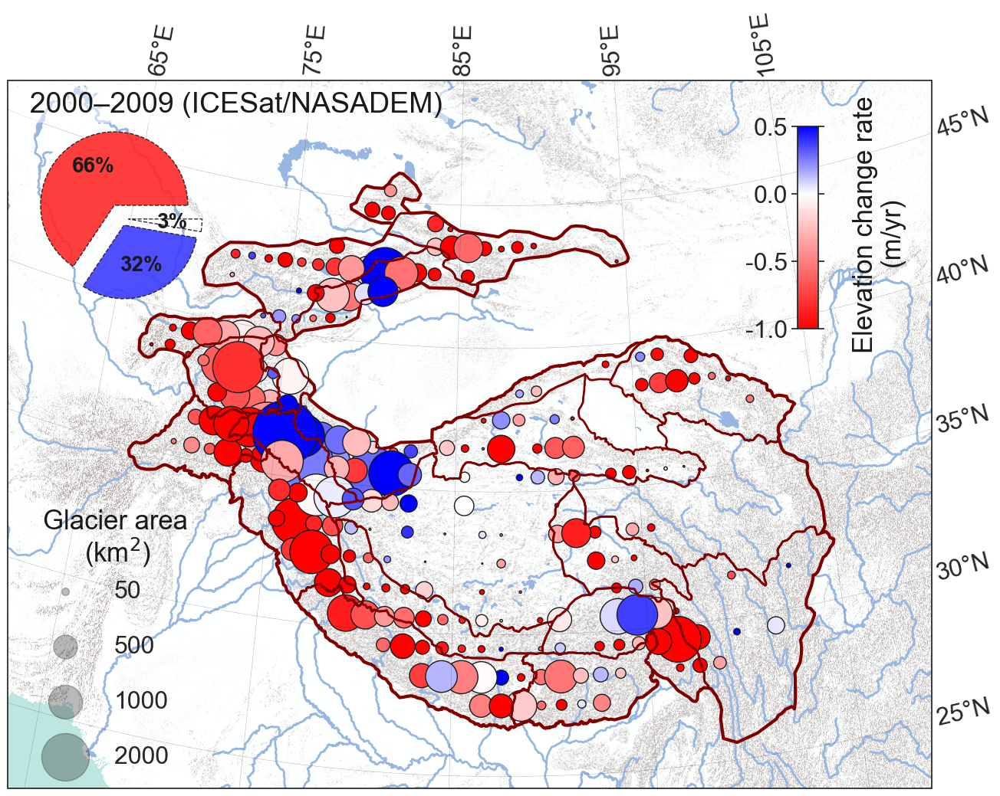

In [14]:
plot_grid_bubble_map(
     var='k_00to09',
     title_text='  2000–2009 (ICESat/NASADEM)',
     grids=grids,
     save_path=r'E:\revised_NCC_data\ICESat_result\ele_changerate_grid\ele_changerate_00to09.pdf',
)

### 4.6 2000-2005

In [17]:
data_grid_ele_year = pd.read_excel(
    r"E:\revised_NCC_data\ICESat_result\ICESat_yearly_elevation_results.xlsx",
    sheet_name='year_value', header=0,
)
data_grid_num_year = pd.read_excel(
    r"E:\revised_NCC_data\ICESat_result\ICESat_yearly_elevation_results.xlsx",
    sheet_name='year_count', header=0,
)

ele_grid = data_grid_ele_year[['start_year','end_year(not included)'] + np.arange(1,497).tolist()]
num_grid = data_grid_num_year[['start_year','end_year(not included)'] + np.arange(1,497).tolist()]

idx = (ele_grid['start_year'] == 2004) & (ele_grid['end_year(not included)'] == 2007)
ele_grid_target = ele_grid.loc[idx, 1:].T
num_grid_target = num_grid.loc[idx, 1:].T

ele_grid_target.index = np.arange(1,497).tolist()
num_grid_target.index = np.arange(1,497).tolist()

if np.isin(['k_00to05'], grids.columns).any():
    pass
else:
    ele_grid_target.columns = ['k_00to05']
    grids = pd.concat([grids, ele_grid_target/5], axis=1)#m/yr

grids

,y,Area,x,pdd,pdd_corr,pdd_jiang,dh_all,dh_allcor,id,dh0020,...,coreg_xs_1,coreg_ys_1,pdd_uncert,geometry,k_03to10,p_03to10,CIhalf_03to10,b_03to10,k_00to09,k_00to05
1,27.6415,0.0000,102.1070,4.303409,0.00000,0.000000,0.000000,0.00000,1,0.00000,...,12.392896,-22.389823,0.199775,"POLYGON ((102.0653 27, 102 27, 102 28, 102.424...",NaN,NaN,NaN,NaN,NaN,NaN
2,30.5000,512.1670,90.5000,4.389645,3.15134,2.084730,-3.909790,-7.06113,2,-8.91566,...,13.992089,-12.842095,0.020761,"POLYGON ((91 30, 90 30, 90 31, 91 31, 91 30))",-0.336331,0.309163,0.648190,674.545128,-0.082363,-0.009206
3,26.8968,0.0000,90.5124,5.325988,0.00000,0.000000,0.000000,0.00000,3,0.00000,...,10.313449,-15.204489,0.047877,"POLYGON ((91 27, 91 26.7814, 90.9629 26.7802, ...",NaN,NaN,NaN,NaN,NaN,NaN
4,45.2123,16.7544,79.4945,-6.242164,-3.11918,0.000000,-10.589300,-7.47012,4,-10.20870,...,11.374880,-10.397242,0.091846,"POLYGON ((79.0739 45.4498, 79.554 45.4116, 80 ...",NaN,NaN,NaN,NaN,NaN,NaN
5,41.5000,659.4700,78.5000,6.300572,3.78460,3.811520,-3.377860,-7.16246,5,-8.96737,...,10.216806,-17.007171,0.038021,"POLYGON ((79 41, 78 41, 78 42, 79 42, 79 41))",-0.332246,0.002161,0.212307,662.307089,-0.533395,-0.828048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
492,34.5000,412.8380,75.5000,-0.366332,-1.75128,0.999016,-9.660970,-7.90969,492,-4.54757,...,10.587047,-15.725570,0.122124,"POLYGON ((76 34, 75 34, 75 35, 76 35, 76 34))",-0.475643,0.232646,0.781054,947.429114,-0.834197,-1.152427
493,37.2473,0.0000,77.4382,2.114425,0.00000,0.000000,0.000000,0.00000,493,0.00000,...,11.816457,-11.976747,0.018694,"POLYGON ((78 37, 77 37, 77 37.6617, 77.2555 37...",NaN,NaN,NaN,NaN,NaN,NaN
494,27.5000,102.9040,90.5000,4.612228,3.73339,0.000000,-16.725100,-20.45850,494,-21.13840,...,11.738170,-16.012244,0.041620,"POLYGON ((91 27, 90 27, 90 28, 91 28, 91 27))",NaN,NaN,NaN,NaN,-1.766127,-1.772390
495,30.5000,127.1690,86.5000,5.511495,3.41028,3.236200,-0.877727,-4.28801,495,-6.41198,...,13.248154,-13.925485,0.216632,"POLYGON ((87 30, 86 30, 86 31, 87 31, 87 30))",0.601351,0.099808,0.716148,-1208.505817,-0.071819,-0.538801


C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\3324611472.py:60: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  grids_copy["Area"][mask] = 0
C:\Users\Administrator\AppData\Local\Temp\ipykernel_44288\3324611472.py:60: SettingWithCop

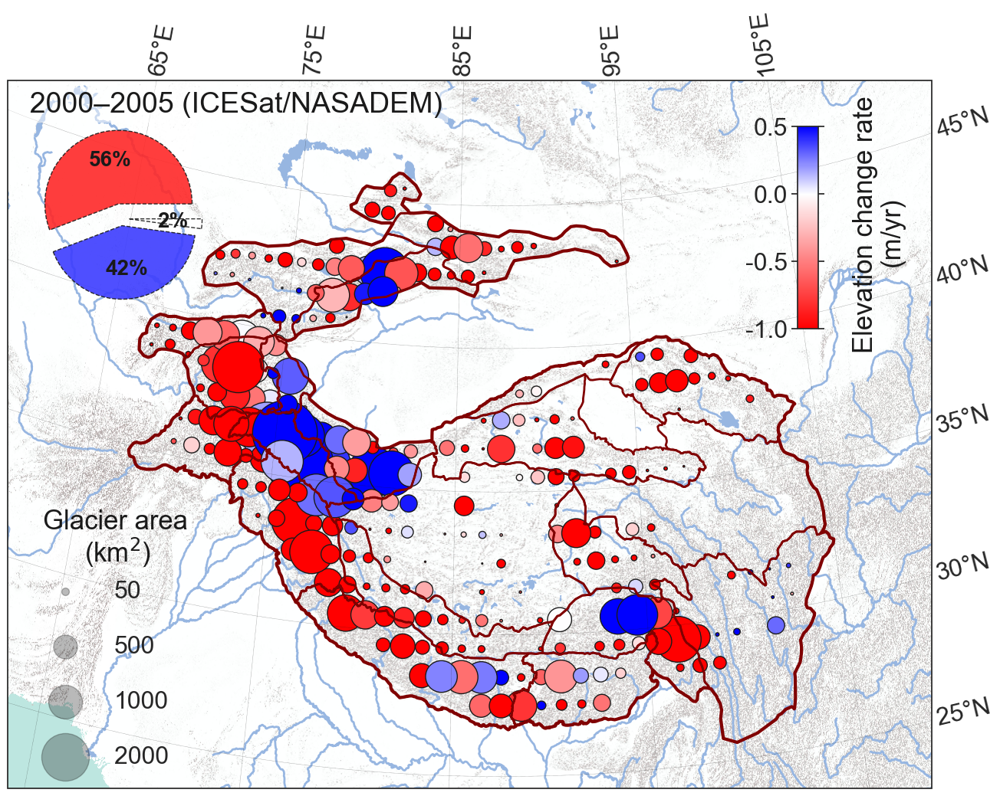

In [19]:
plot_grid_bubble_map(
     var='k_00to05',
     title_text='  2000–2005 (ICESat/NASADEM)',
     grids=grids,
     save_path=r'E:\revised_NCC_data\ICESat_result\ele_changerate_grid\ele_changerate_00to05.pdf',
)

In [20]:
grids.columns.tolist()

['y',
 'Area',
 'x',
 'pdd',
 'pdd_corr',
 'pdd_jiang',
 'dh_all',
 'dh_allcor',
 'id',
 'dh0020',
 'dh00201',
 'dh1922',
 'dh19221',
 'dh19222',
 'pdd_orig',
 'coreg_vshi',
 'coreg_xshi',
 'coreg_yshi',
 'coreg_iter',
 'coreg_vs_1',
 'coreg_xs_1',
 'coreg_ys_1',
 'pdd_uncert',
 'geometry',
 'k_03to10',
 'p_03to10',
 'CIhalf_03to10',
 'b_03to10',
 'k_00to09',
 'k_00to05']

In [21]:
grids.iloc[:, -6:].to_excel(r'E:\revised_NCC_data\ICESat_result\ICESat_HMAgrid_trend.xlsx')